In [1]:
%matplotlib inline
import os, shutil
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as scio
from scipy.fft import fft, ifft, fftfreq
from scipy.signal import stft, ricker, cwt, butter, iirnotch, lfilter
import pywt
from tqdm import tqdm
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn.ensemble import RandomForestClassifier

from sklearn.inspection import DecisionBoundaryDisplay
from matplotlib.colors import ListedColormap

import torch

import mne

In [2]:
mode = 'notebook' #notebook, commit, colab

import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import iplot


from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

if mode == 'colab':
    import cufflinks as cf
    cf.go_offline()
    init_notebook_mode(connected=False)

    def configure_plotly_browser_state():
        import IPython
        display(IPython.core.display.HTML('''
          <script src="/static/components/requirejs/require.js"></script>
          <script>
            requirejs.config({
              paths: {
                base: '/static/base',
                plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
              },
            });
          </script>
          '''))

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio

if mode == 'commit':
    pio.renderers.default = "png"


In [3]:
mne.set_log_level(verbose='ERROR')

# Dataset Processing

- Source: [P300 speller with ALS patients](http://bnci-horizon-2020.eu/database/data-sets)
- Paper: [Attention and P300-based BCI performance in people with amyotrophic lateral sclerosis](https://doi.org/10.3389/fnhum.2013.00732)


**Extract from the paper (Experimental protocol):**

Scalp EEG signals were recorded (g.MOBILAB, g.tec, Austria) from eight channels according to 10–10 standard (Fz, Cz, Pz, Oz, P3, P4, PO7 and PO8; Chatrian et al., 1985; Krusienski et al., 2006) using active electrodes (g.Ladybird, g.tec, Austria). All channels were referenced to the right earlobe and grounded to the left mastoid. The EEG signal was digitized at 256 Hz. Data acquisition and stimuli delivery were managed by the BCI2000 framework (Schalk et al., 2004).

Participants were required to copy spell seven predefined words of five characters each (runs), by controlling a P300 speller (Farwell and Donchin, 1988). The latter consisted of a 6 by 6 matrix containing alphanumeric characters (Figure 1A). Rows and columns on the interface were randomly intensified for 125 ms, with an inter stimulus interval (ISI) of 125 ms, yielding a 250 ms lag between the appearance of two stimuli (stimulus onset asynchrony, SOA). For each character selection (trial) all rows and columns were intensified 10 times (stimuli repetitions) thus each single item on the interface was intensified 20 times. Participants were seated facing a 15” computer screen placed at eye level approximately one meter in front of them. The angular distance subtended by the speller was of 15 degrees. A single flash of a letter at the beginning of each trial cued the target to focus. In the first three runs (15 trials in total) EEG data was stored to perform a calibration of the BCI classifier. Thus no feedback was provided to the participant up to this point. A stepwise linear discriminant analysis (SWLDA) was applied to the data from the three calibration runs (i.e., runs 1–3) to determine the classifier weights (i.e., classifier coefficients) (Krusienski et al., 2006). These weights were then applied during the subsequent four testing runs (i.e., testing set; runs 4–7) when participants were provided with feedback. EEG potentials between 0 and 800 ms after each stimulus onset were decimated by replacing each sequence of 12 samples with their mean value and used for the analysis. The next four runs (20 trials in total) characterized a testing phase in which feedback was provided by showing each spelled character. In cases of error the feedback was represented by a dot (instead of the wrongly typed character) to minimize frustration of the participants.

In [4]:
def load_data(filepath):
    """
    Loads EEG signal from the dataset
    """
    sample_matlab_data = scio.loadmat(filepath)  # Structured Matlab Array containing all information
    return sample_matlab_data

basedir = 'DataFiles'

In [5]:
patient_data = []
for file in os.listdir(basedir):
    filepath = os.path.join(basedir, file)
    patient_data.append(load_data(filepath))
    
print(len(patient_data))

8


In [6]:
patient_data[0]

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN, Created on: Tue Nov 25 12:46:00 2014',
 '__version__': '1.0',
 '__globals__': [],
 'data': array([[(array([[array(['Fz'], dtype='<U2'), array(['Cz'], dtype='<U2'),
                 array(['Pz'], dtype='<U2'), array(['Oz'], dtype='<U2'),
                 array(['P3'], dtype='<U2'), array(['P4'], dtype='<U2'),
                 array(['PO7'], dtype='<U3'), array(['PO8'], dtype='<U3')]],
               dtype=object), array([[ -1.21978372,  -0.32769319,  -1.21995831, ...,  -2.65680554,
                   7.37202505,  -0.27890203],
                [ -1.42616224,  -4.18996393,  -5.65458822, ...,  -9.45534598,
                  -3.67053188,  -5.48506363],
                [ -1.31524453,  -6.87075831,  -8.55992067, ..., -14.26798757,
                 -11.63200572,  -8.92900433],
                ...,
                [ -3.96511643,   5.70748743,   1.11047492, ...,  -5.27998942,
                   9.13724881,  -0.85580654],
                [ -0

In [7]:
def get_channel_name(patient, index):
    """
    Returns the name of the EEG channel for the corresponding index
    """
    return patient['data'][0][0]['channels'][0][index]
print(get_channel_name(patient_data[0], 1))

['Cz']


In [8]:
def get_channel_index(patient, channel_name):
    """
    Returns the index number of a channel
    """
    indices = [data[0].lower() for data in patient['data'][0][0]['channels'][0]]
    return indices.index(channel_name.lower())
print(get_channel_index(patient_data[0], 'Fz'))

0


In [9]:
print("Data shape")
print(f"Signal: {patient_data[0]['data'][0][0]['X'].shape}")
print(f"Target/Class label: {patient_data[0]['data'][0][0]['y'].shape}")
print(f"Stimulus type: {patient_data[0]['data'][0][0]['y_stim'].shape}")

Data shape
Signal: (347704, 8)
Target/Class label: (347704, 1)
Stimulus type: (347704, 1)


### Parameters of the EEG Signal

In [10]:
# Functions for EEG data extraction and manipulation

sample_frequency = 256 #Hz
bandpass_filter = (0, 30) # Hz
stimulus_duration = 125 #ms
interstimulus_interval = 125 #ms
total_stimulus = 12 # 6 rows and 6 columns
number_of_times_each_stimulus_appeared_per_trial = 10
total_stimulus_appeared_per_trial = total_stimulus * number_of_times_each_stimulus_appeared_per_trial

trial_duration = (stimulus_duration * total_stimulus_appeared_per_trial) + \
(interstimulus_interval * (total_stimulus_appeared_per_trial- 1))

samples_per_trial = (sample_frequency * trial_duration)//1000

print(f"Each trial duration: {trial_duration} ms or {samples_per_trial} samples")

Each trial duration: 29875 ms or 7648 samples


In [11]:
def get_trials(sample, remove_calibration_data=True):
    """
    Returns all trial data for a patient
    """
    data = sample['data'][0][0]
    signal = data['X']
    stimulus = data['y_stim']
    target = data['y']
    
    x, y_stimulus, y_target = [], [], []
#     trial_start = 0
    for i in range(data['trial'].shape[1]):
        trial_start = data['trial'][0, i]
        trial_end = trial_start+samples_per_trial
            
            
        # Fetch signal
        x.append(signal[trial_start:trial_end])
        # Fetch stimulus
        y_stimulus.append(stimulus[trial_start:trial_end, 0])
        # Fetch target
        y_target.append(target[trial_start:trial_end, 0])

    x, y_stimulus, y_target = np.array(x), np.array(y_stimulus), np.array(y_target)
    if remove_calibration_data:
        x, y_stimulus, y_target = x[3:], y_stimulus[3:], y_target[3:]
    return x, y_stimulus, y_target

X, y_stim, y_target = get_trials(patient_data[0])
print(X.shape, y_stim.shape, y_target.shape)
print(np.unique(y_stim))
print(np.unique(y_target))

(32, 7648, 8) (32, 7648) (32, 7648)
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[0 1 2]


In [12]:

number_of_trials_per_run = 5 # each run is a word and each trial is a character of the word
number_of_runs = 7 # total number of words

total_characters_with_calibration = number_of_trials_per_run * number_of_runs
total_characters_without_calibration = number_of_trials_per_run * number_of_runs - 3

def get_dataset(dataset):
    """
    Converts the matlab file of all patients to a single numpy array and returns the dataset
    Returns: Numpy array -> input shape: (patient_id, run, trial, sample, channels), 
             stimulus -> (patient_id, run, trial, sample)
             target -> (patient_id, run, trial, sample)
    """
    x, y_stim, y_target = [], [], []
    for i in range(len(dataset)):
        patient = dataset[i]
        x_trial, y_stim_trial, y_target_trial = get_trials(patient, remove_calibration_data=False)
        
        # Reshape array to group trials by run
        x_trial = x_trial.reshape(-1, number_of_trials_per_run, x_trial.shape[1], x_trial.shape[2])
        y_stim_trial  = y_stim_trial.reshape(-1, number_of_trials_per_run, y_stim_trial.shape[1])
        y_target_trial = y_target_trial.reshape(-1, number_of_trials_per_run, y_target_trial.shape[1])
        
        # Add to array
        x.append(x_trial)
        y_stim.append(y_stim_trial)
        y_target.append(y_target_trial)
        
    return np.array(x), np.array(y_stim), np.array(y_target)
        
        
X, y_stim, y_target = get_dataset(patient_data)

print(X.shape, y_stim.shape, y_target.shape)
print(np.unique(y_stim))
print(np.unique(y_target))

(8, 7, 5, 7648, 8) (8, 7, 5, 7648) (8, 7, 5, 7648)
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[0 1 2]


### Mapping for row/column value to character

In [13]:
words =np.array([chr(i) for i in range(ord('A'), ord('Z')+1)] + [str(i) for i in range(1, 10)] + ['-'])
word_matrix = np.reshape(words, (6, 6))
word_matrix_row = np.arange(7, 13)
word_matrix_column = np.arange(1, 7)
print(word_matrix)
word_to_tup = {}
tup_to_word = {}
for i in range(word_matrix.shape[0]):
    for j in range(word_matrix.shape[1]):
        tup = (word_matrix_row[i], word_matrix_column[j])
        word_to_tup[word_matrix[i, j]] = tup
        tup_to_word[str(tup[0]) + "," + str(tup[1])] = word_matrix[i, j]
        
print("\nCharacter to indices")
print(word_to_tup)
print("\n Indices to Characters")
print(tup_to_word)

[['A' 'B' 'C' 'D' 'E' 'F']
 ['G' 'H' 'I' 'J' 'K' 'L']
 ['M' 'N' 'O' 'P' 'Q' 'R']
 ['S' 'T' 'U' 'V' 'W' 'X']
 ['Y' 'Z' '1' '2' '3' '4']
 ['5' '6' '7' '8' '9' '-']]

Character to indices
{'A': (7, 1), 'B': (7, 2), 'C': (7, 3), 'D': (7, 4), 'E': (7, 5), 'F': (7, 6), 'G': (8, 1), 'H': (8, 2), 'I': (8, 3), 'J': (8, 4), 'K': (8, 5), 'L': (8, 6), 'M': (9, 1), 'N': (9, 2), 'O': (9, 3), 'P': (9, 4), 'Q': (9, 5), 'R': (9, 6), 'S': (10, 1), 'T': (10, 2), 'U': (10, 3), 'V': (10, 4), 'W': (10, 5), 'X': (10, 6), 'Y': (11, 1), 'Z': (11, 2), '1': (11, 3), '2': (11, 4), '3': (11, 5), '4': (11, 6), '5': (12, 1), '6': (12, 2), '7': (12, 3), '8': (12, 4), '9': (12, 5), '-': (12, 6)}

 Indices to Characters
{'7,1': 'A', '7,2': 'B', '7,3': 'C', '7,4': 'D', '7,5': 'E', '7,6': 'F', '8,1': 'G', '8,2': 'H', '8,3': 'I', '8,4': 'J', '8,5': 'K', '8,6': 'L', '9,1': 'M', '9,2': 'N', '9,3': 'O', '9,4': 'P', '9,5': 'Q', '9,6': 'R', '10,1': 'S', '10,2': 'T', '10,3': 'U', '10,4': 'V', '10,5': 'W', '10,6': 'X', '11,1': '

In [14]:
target_class = 2
non_target_class = 1
def convert_stimulus_to_word(y_stim, y_target):
    """
    Takes all consecutive stimulus (row & column number of BCI) and outputs the corresponding word that was 
    displayed.
    Input shape: (Patients, run, trial, samples)
    Output shape: (Patients, run, trial, character)
    """
    y_stim = y_stim.reshape(-1)
    y_target = y_target.reshape(-1)
    target_stimulus = y_stim[y_target == target_class ]
    vals = []
    for i in range(len(target_stimulus)):
        if len(vals) == 0 or  vals[-1] != target_stimulus[i]:
            vals.append(target_stimulus[i])

    character_indices = []
    characters = []
    for i in range(0, len(vals)-1, 2):
        c = vals[i]
        r = vals[i+1]
        character_indices.append((r, c))
        characters.append(tup_to_word[str(r) + "," + str(c)])
    
    non_repeating_chars = []
    for c in characters:
        if len(non_repeating_chars) == 0 or non_repeating_chars[-1] != c:
            non_repeating_chars.append(c)
    
    words = []
    for i in range(0, len(non_repeating_chars), 5):
        words.append(''.join(non_repeating_chars[i:i+5]))
    return words

for i in range(X.shape[0]):
    print(f"Words displayed to patient: {i+1}")
    print(convert_stimulus_to_word(y_stim[0], y_target[0]))

    

Words displayed to patient: 1
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 2
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 3
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 4
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 5
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 6
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 7
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 8
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']


# High level overview of the dataset

First we will visualize the EEG signals collected from different patients. We will do a visual inspection to see some of the characteristics of the dataset e.g. what are the minimum and maximum amplitude of the signals for different patients, are there any visible artifacts in the signal, etc.

In [15]:
get_channel_index(patient_data[0], 'PO7')

6

In [16]:
def view_signal(signal, title='', channels_to_show=[], highpass=None, lowpass=None, y=None, scalings='auto'):
    signal = signal.reshape(-1, signal.shape[-1]).transpose()
    channels = ['P3', 'PO7', 'Fz', 'Cz', 'Pz', 'Oz', 'P4', 'PO8']
    channel_indices = [get_channel_index(patient_data[0], name) for name in channels]
#     channel_indices = [i for i in range(signal.shape[0])]
#     channels = [get_channel_name(patient_data[0], i)[0] for i in channel_indices]
    if len(channels_to_show) == 0:
        channels_to_show = [i for i in range(len(channels))]
    else:
        channels_to_show = [channels.index(channel) for channel in channels_to_show]
    
    info = mne.create_info(channels, sample_frequency, ch_types='eeg')
    data = mne.io.RawArray(signal[channel_indices, :], info)
    
    target_descriptions = ['No stimulus', 'Non-Target', 'Target']
    target_description_indices = {i:target_descriptions[i] for i in range(len(target_descriptions))}
    target_description_names = {target_descriptions[i]: i for i in range(len(target_descriptions))}
    
    if not (y is None):
        y = y.reshape(-1)
        target = np.where(y == target_description_names['Target'])[0]
        non_targets = np.where(y == target_description_names['Non-Target'])[0]
        onsets = []
        duration = []
        description = []
        
        for i in range(len(target)):
            if i == 0:
                onsets.append(target[i])
                description.append('T')
            else:
                if target[i] != target[i-1]+1:
                    duration.append(target[i-1] - onsets[-1])
                    onsets.append(target[i])
                    description.append('T')
                elif i == len(target) - 1:
                    duration.append(target[i] - onsets[-1])
                    
        for i in range(len(non_targets)):
            if i == 0:
                onsets.append(non_targets[i])
                description.append('N')
            else:
                if non_targets[i] != non_targets[i-1]+1:
                    duration.append(non_targets[i-1] - onsets[-1])
                    onsets.append(non_targets[i])
                    description.append('N')
                elif i == len(non_targets) - 1:
                    duration.append(non_targets[i] - onsets[-1])
                    
        onsets = np.array(onsets)/sample_frequency
        duration = np.array(duration)/sample_frequency
            
        data.set_annotations(mne.Annotations(onsets, duration, description))
    
    
    data.plot(scalings=scalings, title=title, order=channels_to_show, highpass=highpass, lowpass=lowpass)
    

In [17]:
X.shape, y_target.shape

((8, 7, 5, 7648, 8), (8, 7, 5, 7648))

Patient 1


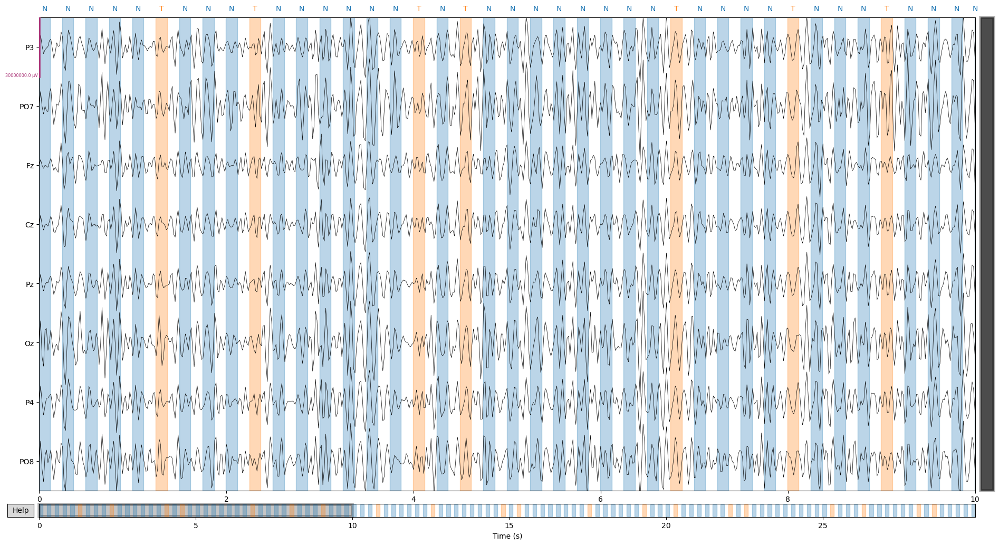

Patient 2


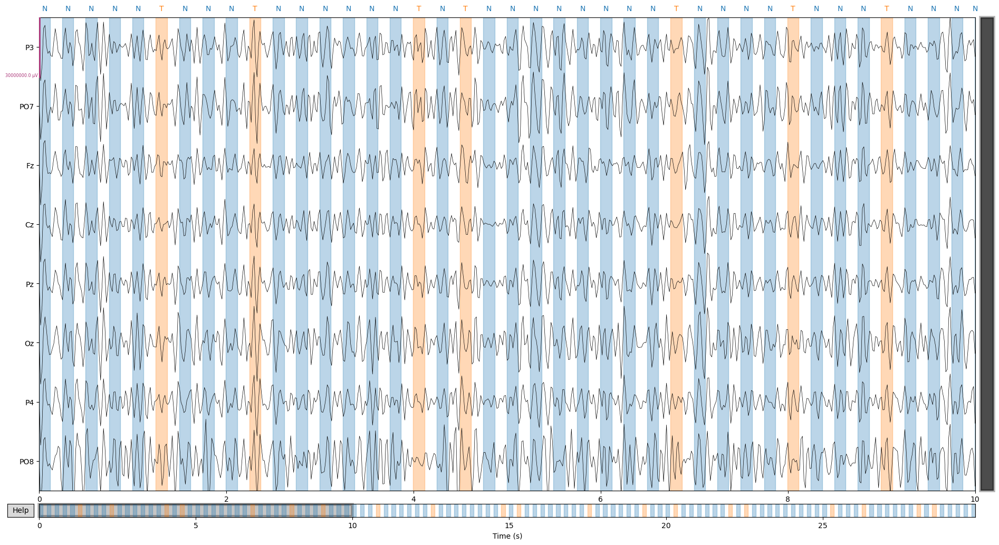

Patient 3


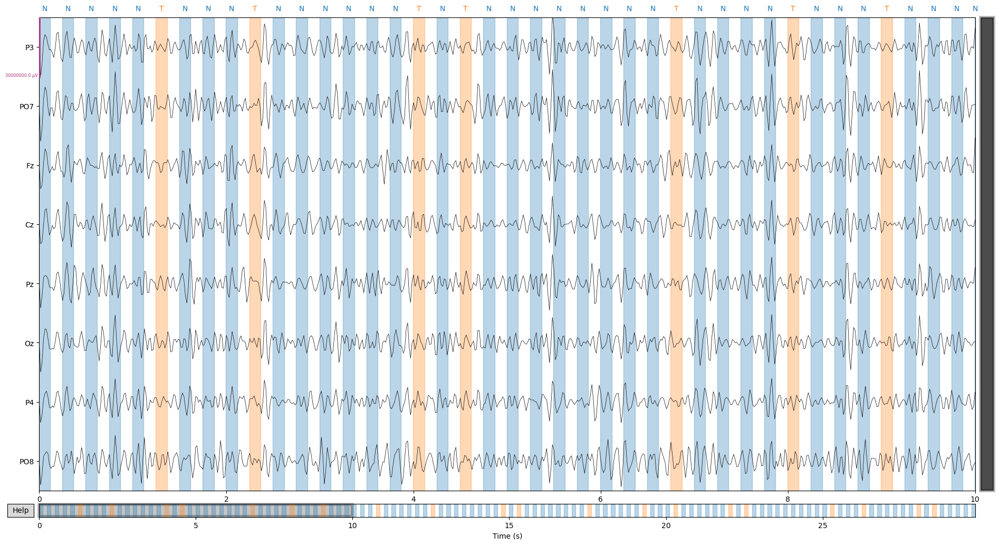

Patient 4


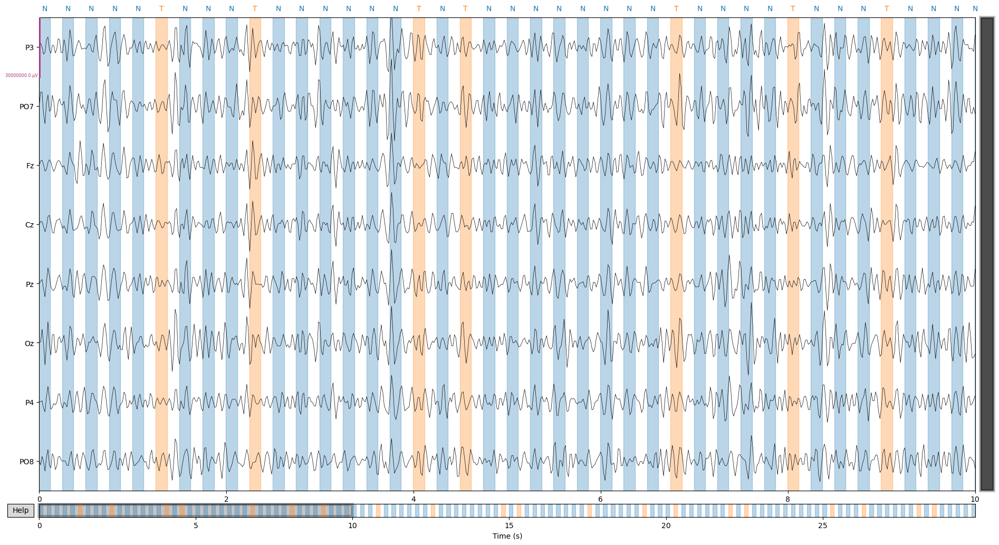

Patient 5


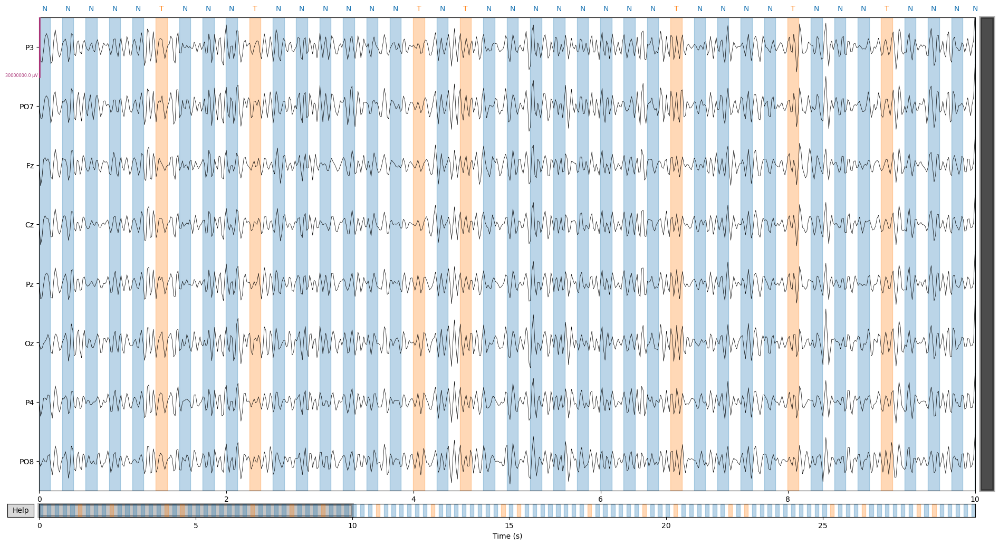

Patient 6


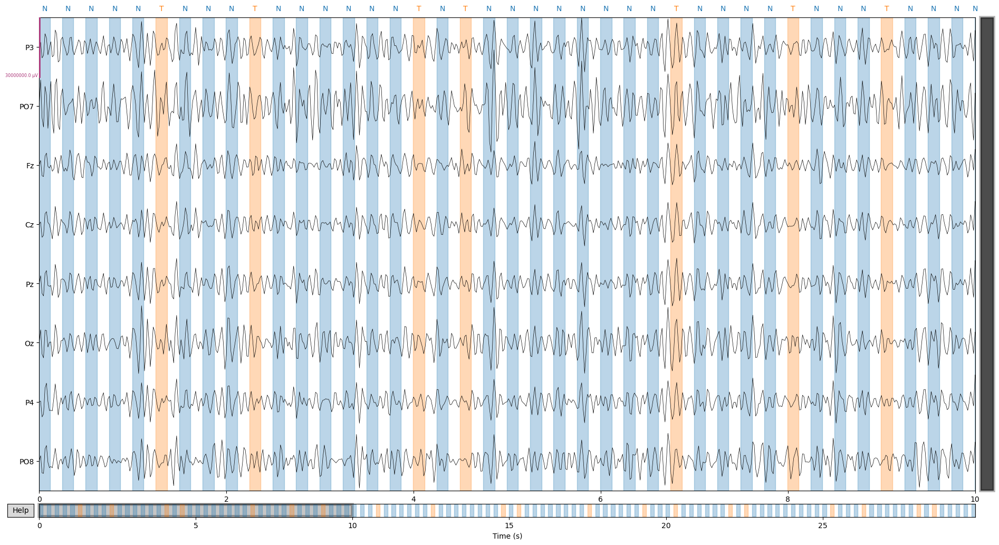

Patient 7


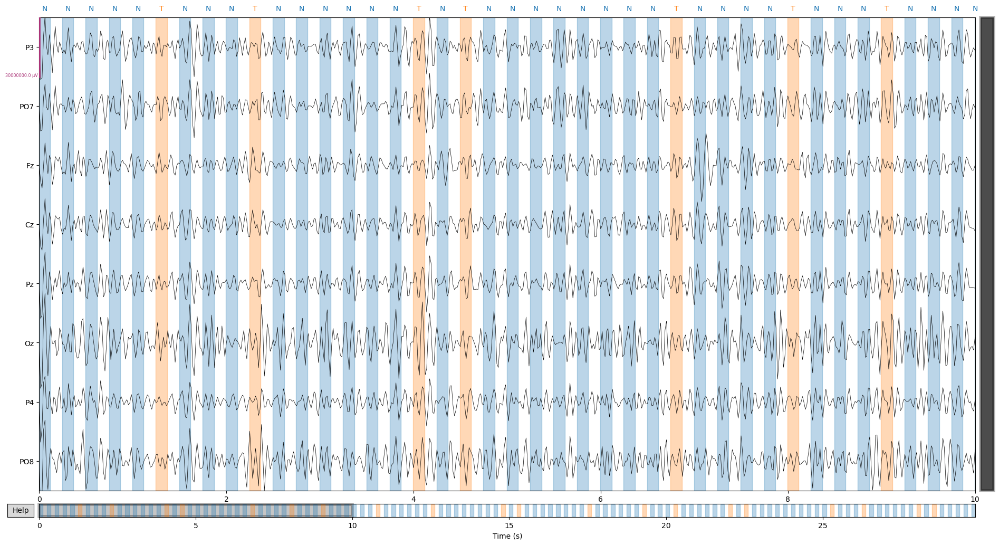

Patient 8


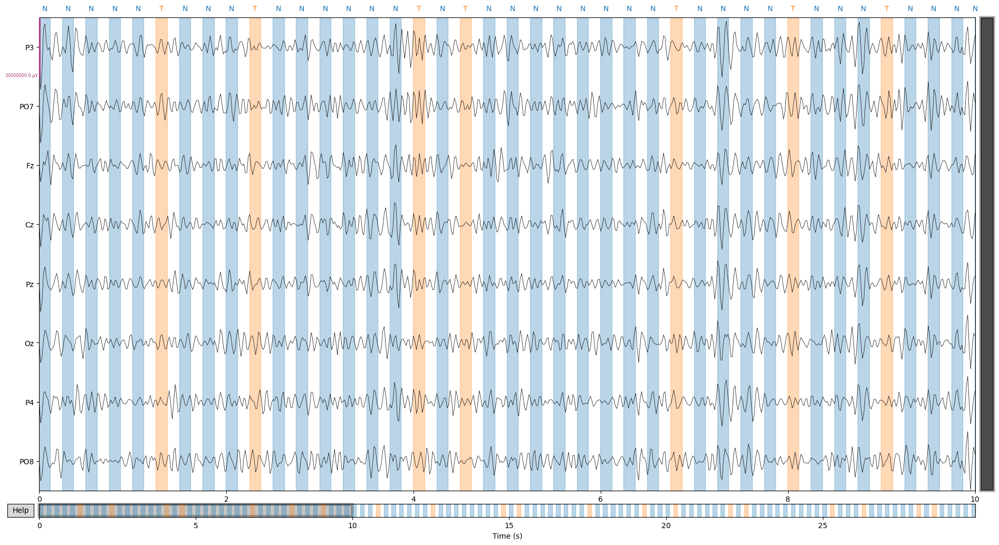

In [18]:
for i in range(X.shape[0]):
    print(f"Patient {i+1}")
    view_signal(X[i, 0, 0, :, :], title=f'Patient {i+1}', lowpass=20, highpass=8, y=y_target[i], scalings=dict(eeg=15))


In [19]:
# # View in new window
# %matplotlib qt
# patient = 7
# view_signal(X[patient, 0, 0], title='Patient 1', highpass=0.1, lowpass=10, y=y_target[patient])

## Removing Artifacts - Part I

In this section we will follow the same procedure mentioned in the paper to remove the artifacts and visualize the EEG signal.

**Extract from the paper (Data Analysis):**

EEG data was high pass and low pass filtered with cut off frequencies of 0.1 Hz and 10 Hz respectively using a 4th order Butterworth filter. In addition, a notch filter was used to remove 50 Hz contamination due to the AC interference. Data was divided into 1000 ms long epochs starting with the onset of each stimulus. Epochs in which peak amplitude was higher than 70 μV or lower than −70 μV were identified as artifacts and removed. A baseline correction was done based on the average EEG activity within 200 ms immediately preceding each epoch. The average waveform for both target and non-target epochs was computed for each trial in order to assess P300 peak amplitude. Particularly, amplitude of the P300 potential in Cz was defined as the highest value of the difference between target and non-target average waveforms in the time interval 250–700 ms

In [20]:
def butter_bandpass(lowcut, highcut, fs, order=4):
    return butter(order, [lowcut, highcut], fs=fs, btype='band')

def butter_bandpass_filter(data, lowcut, highcut, fs, order=4, axis=-1):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data, axis=axis)
    return y

def notch_filter(data, frequency, fs, axis=-1, quality_factor=30.0):
    b, a = iirnotch(frequency, quality_factor, fs)
    return lfilter(b, a, data, axis=axis)

In [21]:
highpass_filter = 0.1 #Hz
lowpass_filter = 10 #Hz
notch_frequency = 50 #Hz

**Filter the signal**

In [22]:
X_filtered = butter_bandpass_filter(X, highpass_filter, lowpass_filter, sample_frequency, order=4, axis=3)
X_filtered = notch_filter(X_filtered, notch_frequency, sample_frequency, axis=3)
print(X_filtered.shape)

(8, 7, 5, 7648, 8)


**Remove amplitude greater than 70uV or less than -70uv**

In [23]:
minimum_amplitude = -70
maximum_amplitude = 70

X_filtered[(X_filtered < minimum_amplitude) | (X_filtered > maximum_amplitude)] = 0
print(X_filtered.shape)

(8, 7, 5, 7648, 8)


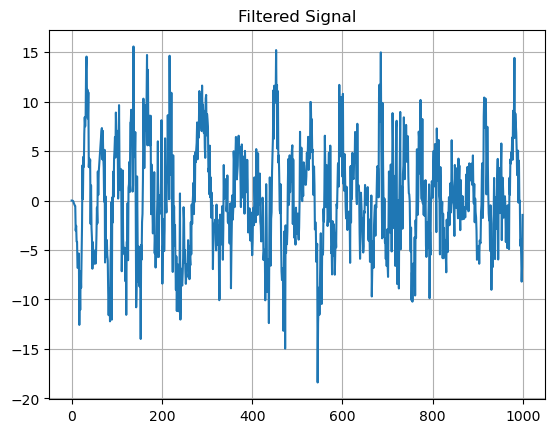

In [24]:
plt.figure()
plt.title("Filtered Signal")
plt.plot(X_filtered.reshape((X_filtered.shape[0], -1, X_filtered.shape[1]))[1, :1000, 0])
plt.grid()
plt.show()

**Baseline correction**

In [25]:
baseline_duration = 200 #ms
baseline_samples = int(sample_frequency*baseline_duration/1000)
epoch_duration = 1000 #ms
epoch_samples = int(sample_frequency*epoch_duration/1000)

X_filtered = X_filtered.reshape((X_filtered.shape[0], -1, X_filtered.shape[-1]))
y_filtered = y_target.reshape((y_target.shape[0], -1))

for patient in range(X_filtered.shape[0]):
    for channel in range(X_filtered.shape[-1]):
        i = 0
        while i < X_filtered.shape[1]:
            if y_filtered[patient, i] != 0: # Stimulus onset
                average = 0
                if i > baseline_samples:
                    average = np.mean(X_filtered[patient, i-baseline_samples:i+epoch_samples, channel])
                X_filtered[patient, i:i+epoch_samples, channel] = X_filtered[patient, i:i+epoch_samples, channel] - average
                i = i + epoch_samples
            else:
                i += 1
del y_filtered
X_filtered = X_filtered.reshape(X.shape)
print(X_filtered.shape)

(8, 7, 5, 7648, 8)


Patient 1


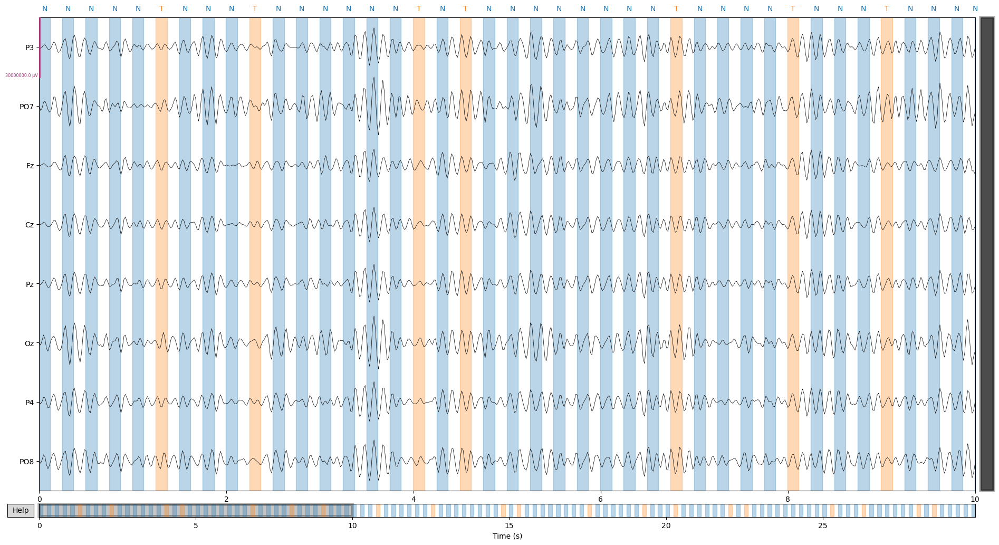

Patient 2


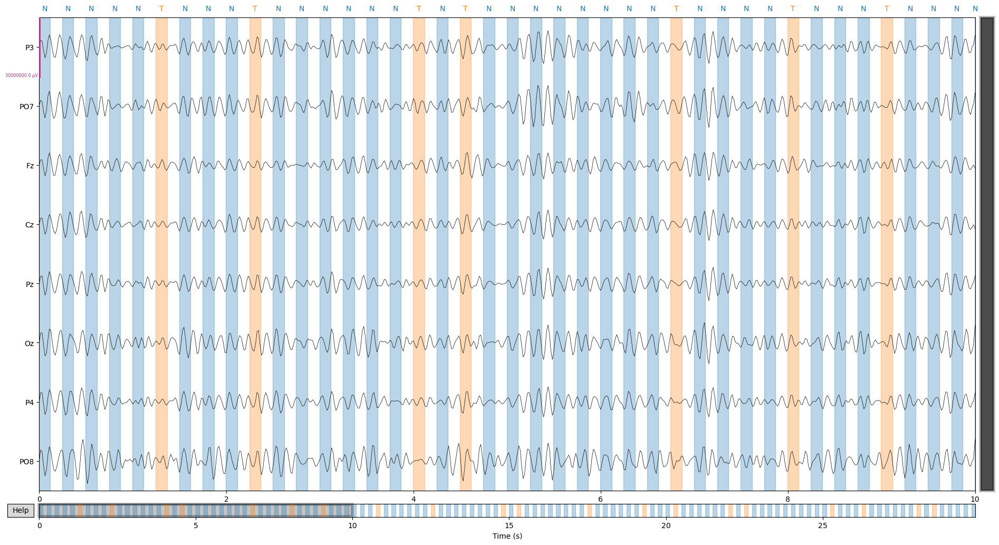

Patient 3


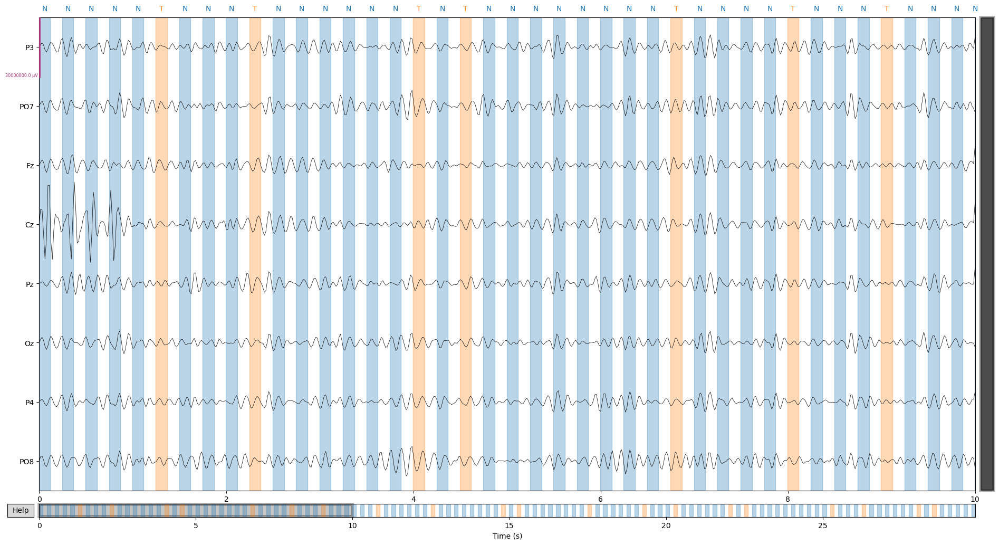

Patient 4


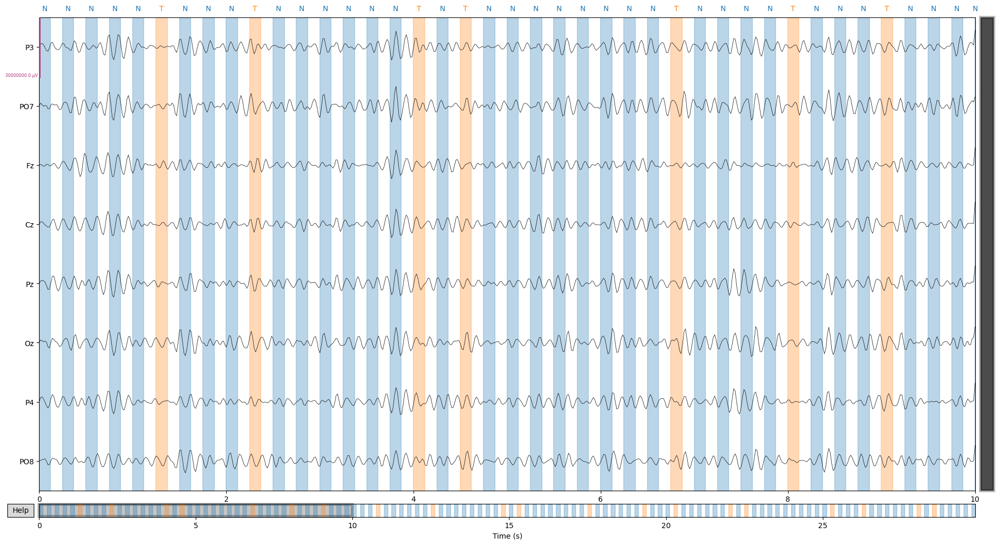

Patient 5


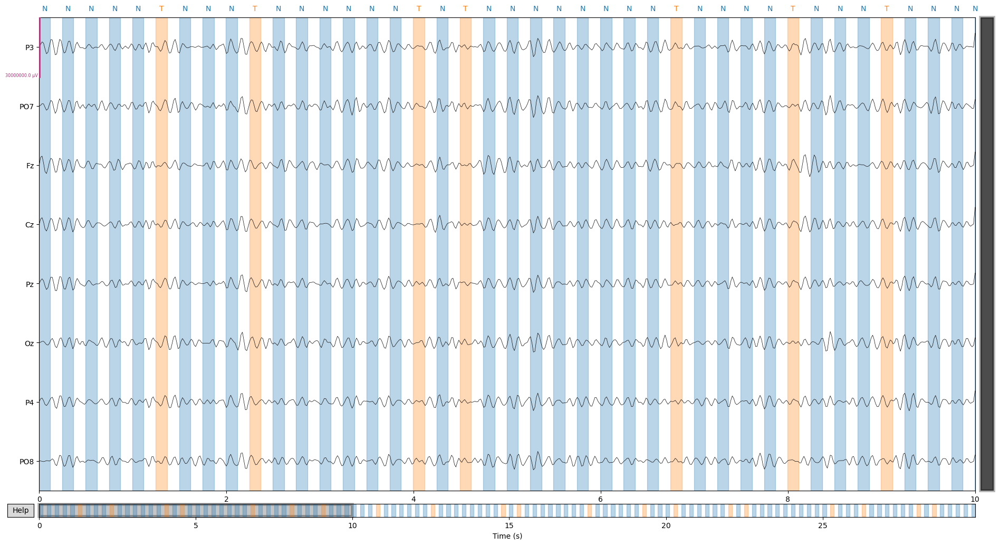

Patient 6


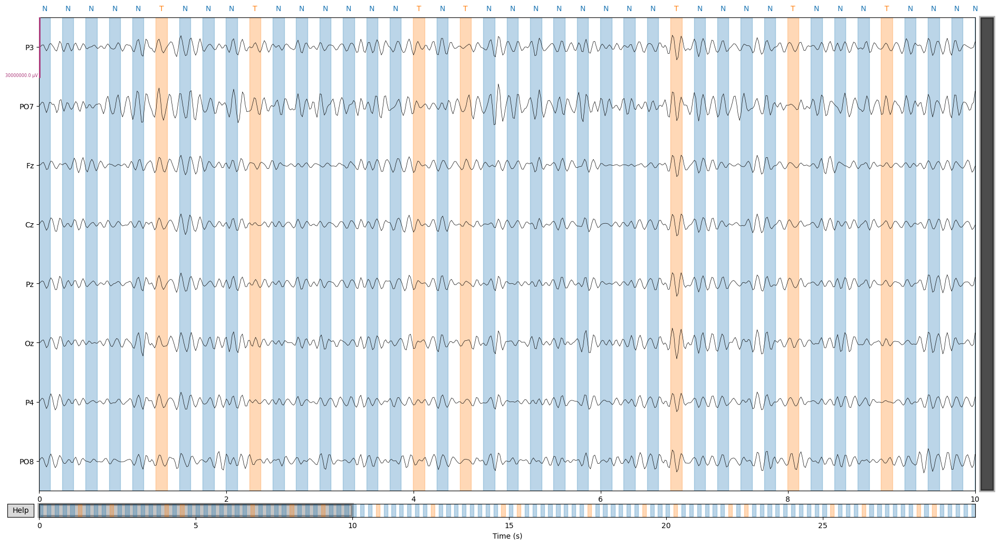

Patient 7


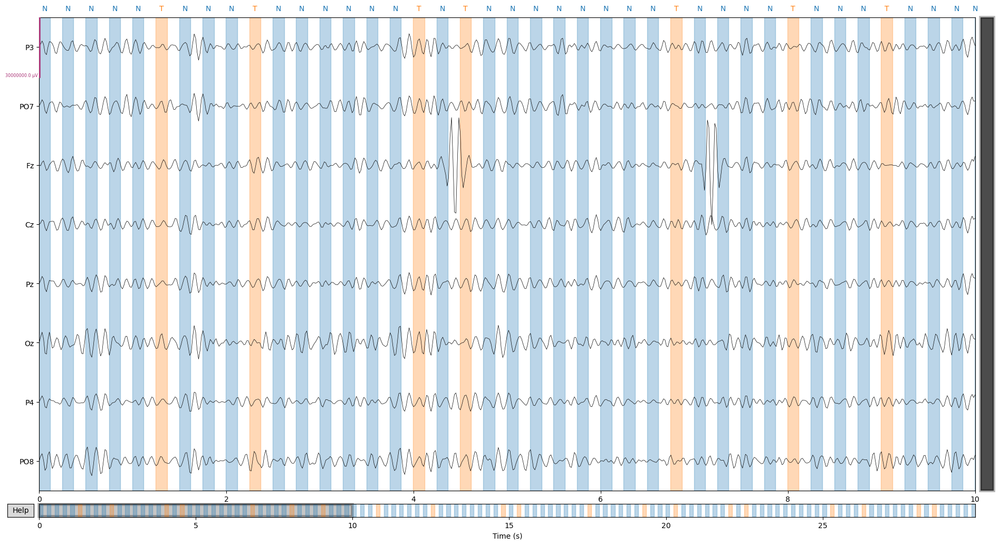

Patient 8


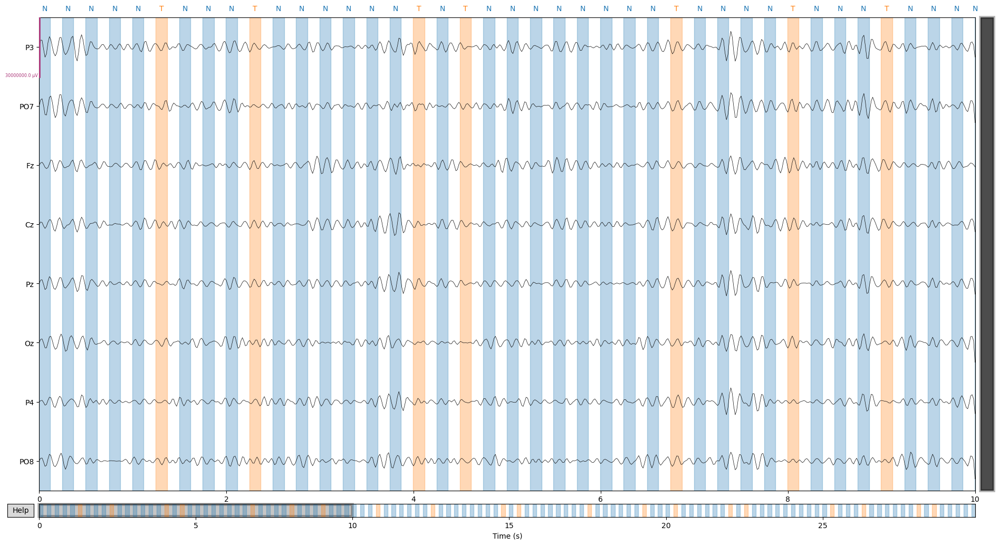

In [26]:
%matplotlib inline
for i in range(X.shape[0]):
    print(f"Patient {i+1}")
    view_signal(X_filtered[i, 0, 0, :, :], title=f'Patient {i+1}', lowpass=20, highpass=8, y=y_target[i], 
                scalings=dict(eeg=15))


In [27]:
# %matplotlib qt
# view_signal(X_filtered[1, 0:2, 0:5, :, :], title=f'Patient {i+1}', y=y_target[i])

### Calculating average waveform of each onset

In the paper, the waveform that occured in each trial between 200-700 ms after each onset was collected from 'Cz' channel. The average waveform was calculated for each onset type (Target and Non-target). The highest value of the difference between the average target and non-target waveform was considered as the P300 amplitude.

(699, 256) (3496, 256)


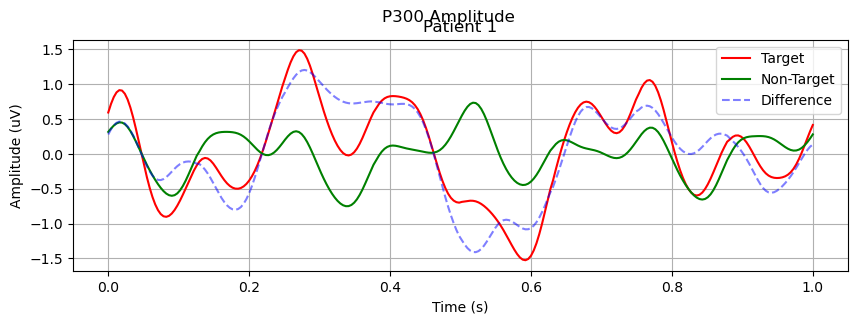

(699, 256) (3496, 256)


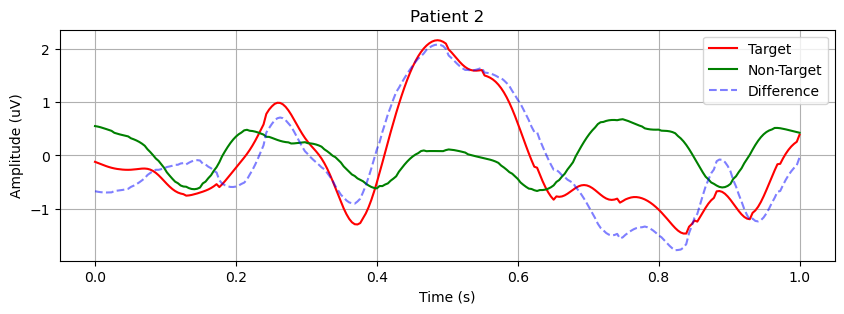

(699, 256) (3496, 256)


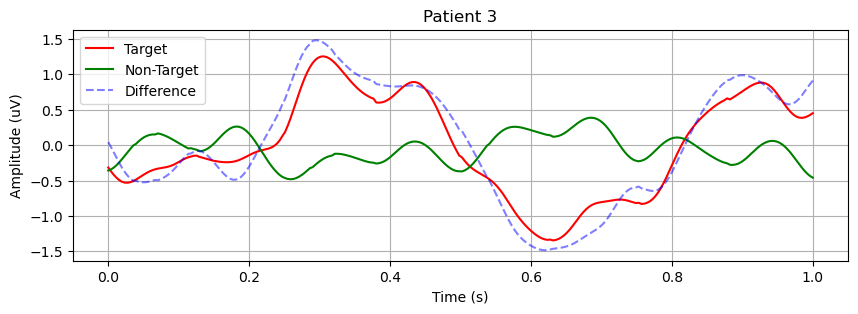

(699, 256) (3496, 256)


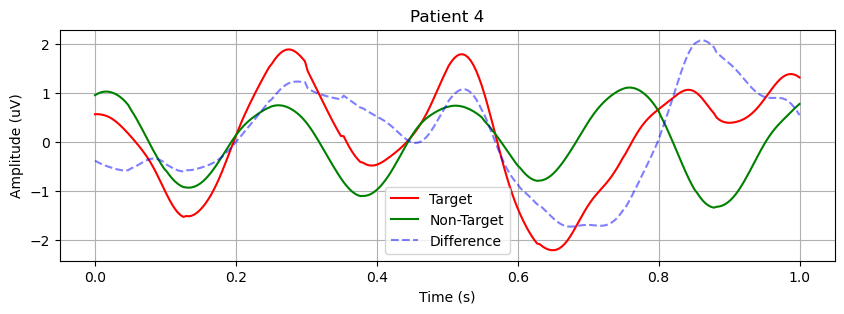

(699, 256) (3496, 256)


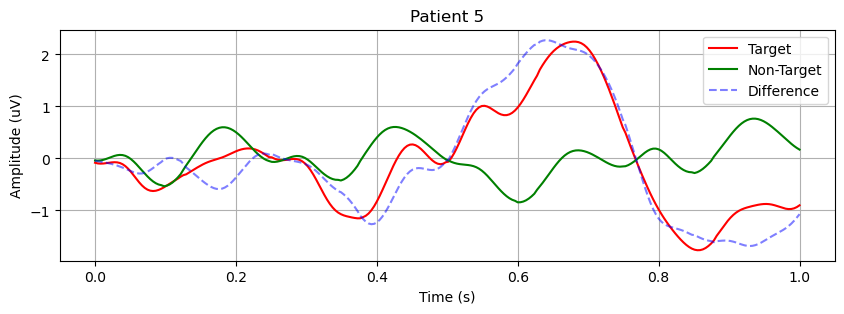

(699, 256) (3496, 256)


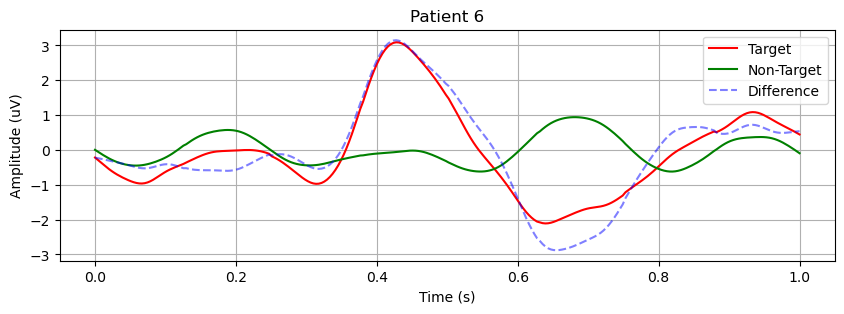

(699, 256) (3496, 256)


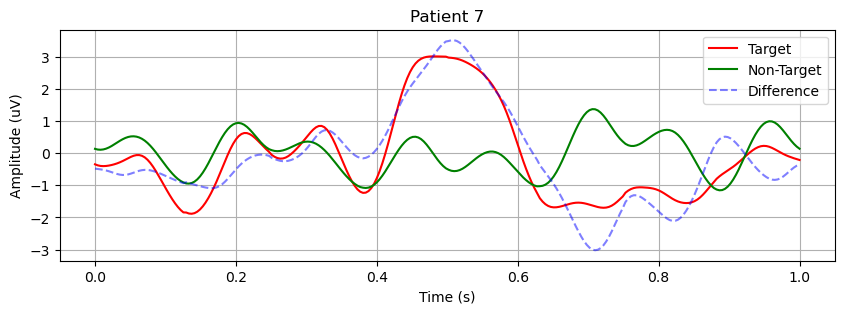

(699, 256) (3496, 256)


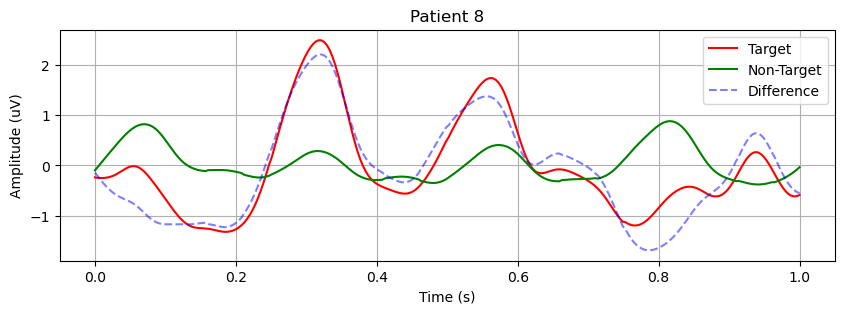

In [28]:


waveform_start_time_after_onset = 0
waveform_end_time_after_onset = 1000
waveform_start_sample_after_onset = int(sample_frequency * waveform_start_time_after_onset / 1000)
waveform_end_sample_after_onset = int(sample_frequency * waveform_end_time_after_onset / 1000)

for i in range(X_filtered.shape[0]):
    target_waveforms = []
    non_target_waveforms = []
    x = X_filtered[i, :, :, :, get_channel_index(patient_data[0], 'Cz')].reshape(-1)
    y = y_target[i].reshape(-1)
    
    for j in range(1, y.size):
        if (y[j] != 0) and  (y[j-1] != y[j]): # start of onset
            if j + waveform_end_sample_after_onset < y.size:
                if y[j] == 1:
                    non_target_waveforms.append(x[j+waveform_start_sample_after_onset:j+waveform_end_sample_after_onset])
                else:
                    target_waveforms.append(x[j+waveform_start_sample_after_onset:j+waveform_end_sample_after_onset])
    
    target_waveforms = np.array(target_waveforms)
    non_target_waveforms = np.array(non_target_waveforms)
    
    x_axis = np.linspace(0, target_waveforms.shape[1]/sample_frequency, target_waveforms.shape[1])
    print(target_waveforms.shape, non_target_waveforms.shape)
    target_waveforms = np.mean(target_waveforms, axis=0)
    non_target_waveforms = np.mean(non_target_waveforms, axis=0)
    
    
    plt.figure(figsize=(10,3))
    if i == 0:
        plt.suptitle("P300 Amplitude")
    plt.title(f"Patient {i+1}")
    
    plt.plot(x_axis, target_waveforms, 'r-', label='Target')
    plt.plot(x_axis, non_target_waveforms, 'g-', label='Non-Target')
    plt.plot(x_axis, target_waveforms - non_target_waveforms, 'b--', alpha=0.5, label='Difference')
    
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (uV)")
    plt.legend()
    plt.grid()
    plt.subplots_adjust(hspace=0.5)
    plt.show()
    

## Classification - Part 1

**Extract from the paper (Single trial classification)**

To provide an estimate of the classifier accuracy we considered the binary classification problem target vs. non-target (Blankertz et al., 2011) that takes into account the correct classification of a target or of a non-target. Frequency filtering, data segmentation and artifact rejection were conducted as in P300 morphology section. EEG data were then resampled by replacing each sequence of 12 samples with their mean value, yielding 17 × 8 samples per epoch (eight being the number of channels), which were concatenated in a feature vector (Krusienski et al., 2006). A seven-fold cross-validation was used to evaluate the binary accuracy (BA) of the classifier on each participant’s dataset. For each iteration we applied a SWLDA on the testing dataset (consisting of six words) to extract the 60 most significant control features (Draper and Smith, 1998) and we assessed the BA on the training dataset (the remaining word).

In [29]:
def create_dataset(x, y, show_progress=False, get_delayed_samples=0, get_fft=False):
    """
    Input Shape: (**, Samples, channels), (-1)
    Output Shape: (N, Samples, channels), (N)
    """
    
    # Reshape dataset to align all signals into a single dimension
    x = x.reshape(-1, x.shape[-1])
    y = y.reshape(-1)
    
    # Pad signal with additional samples if extended waveform is required
    if get_delayed_samples > 0:
        x = np.concatenate( (np.ones((get_delayed_samples, x.shape[1]), dtype='<f8')* x[0, :], x, np.ones((get_delayed_samples, x.shape[1]), dtype='<f8')* x[-1, :])  )
        y = np.concatenate( (np.ones((get_delayed_samples,), dtype='<i2')* y[0], y, np.ones((get_delayed_samples,), dtype='<i2')* y[-1])  )
        
    sequences = [] # sequences split by target type
    sequence_targets = [] # Final output that will contain the label of each sequence
    current_sequence = [0]
    if get_delayed_samples > 0:
        current_sequence = [i for i in range(get_delayed_samples+1)]
    last_value = y[current_sequence[-1]] 
    
    added_delayed_samples = 0    
    start_adding_delayed_samples = False
    # We will split the targets based on continuous sequence of same stimulus type
    vals = range(1+get_delayed_samples, y.shape[0] - get_delayed_samples, 1)
    if show_progress:
        vals = tqdm(vals)
        
    for i in vals:
        # If sequence is continuing
        if y[i] == last_value:
            current_sequence.append(i) # Add to current sequence
        else:
            # Sequence has ended. Add current sequence to list of sequences and start a new sequence
            added_delayed_samples = 0
            start_adding_delayed_samples = True
            sequences.append(current_sequence)
            sequence_targets.append(last_value)
            if get_delayed_samples > 0:
                sequences[-1] += [j for j in range(i, i+get_delayed_samples, 1)]
                current_sequence = [j for j in range(i-get_delayed_samples,i+1)]
            else:
                current_sequence = [i]

                
        last_value = y[i]
    
    if len(current_sequence) > 0:
        sequences.append(current_sequence)
        sequence_targets.append(last_value)
        if get_delayed_samples > 0:
            sequences[-1] += [j for j in range(current_sequence[-1], current_sequence[-1]+get_delayed_samples, 1)]
            
    sequence_samples = []
    
    # Pad signals to make each signal of the same shape
    max_length = np.max([len(sequences[i]) for i in range(len(sequences))])
    if show_progress:
        sequences = tqdm(sequences)
    for sequence in sequences:
        l = len(sequence)
        if l > max_length:
            sequence  = sequence[:max_length]
        elif l < max_length:
            diff = max_length - l
            sequence = sequence + ([sequence[-1]]*diff)
        s = x[sequence, :]
        
        sequence_samples.append(s)
        
    
    return np.array(sequence_samples), np.array(sequence_targets)

In [30]:
np.array([1, 2, 3, 4, 5, 6]).reshape((-1, 2)).mean(axis=1)

array([1.5, 3.5, 5.5])

### Create Dataset:

1. Labels: Non-Target(1), Target (2)
2. Input Size: 17x8 = 136

In [31]:
total_samples_per_class = 17*12 # Number of samples in each waveform
additional_samples = total_samples_per_class - int(256*stimulus_duration/1000) # Additional sample
x, y = create_dataset(X_filtered, y_target, get_delayed_samples=additional_samples)
x = x[:, additional_samples:, :] # Discard first left part of the waveform
print(x.shape)

# Calculate average of consecutive 12 samples to get a sample of size 17x8
x = x.reshape((x.shape[0], 12, 17, x.shape[-1])).mean(axis=1)
x = x.reshape((x.shape[0], -1))

# Classify only target and non-target signals
indices = np.where(y != 0)[0]
y = y[indices]
x = x[indices]
print(x.shape, y.shape)

(67200, 204, 8)
(33600, 136) (33600,)


In [32]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=6150)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(26880, 136) (26880,) (6720, 136) (6720,)


### PCA for visualization

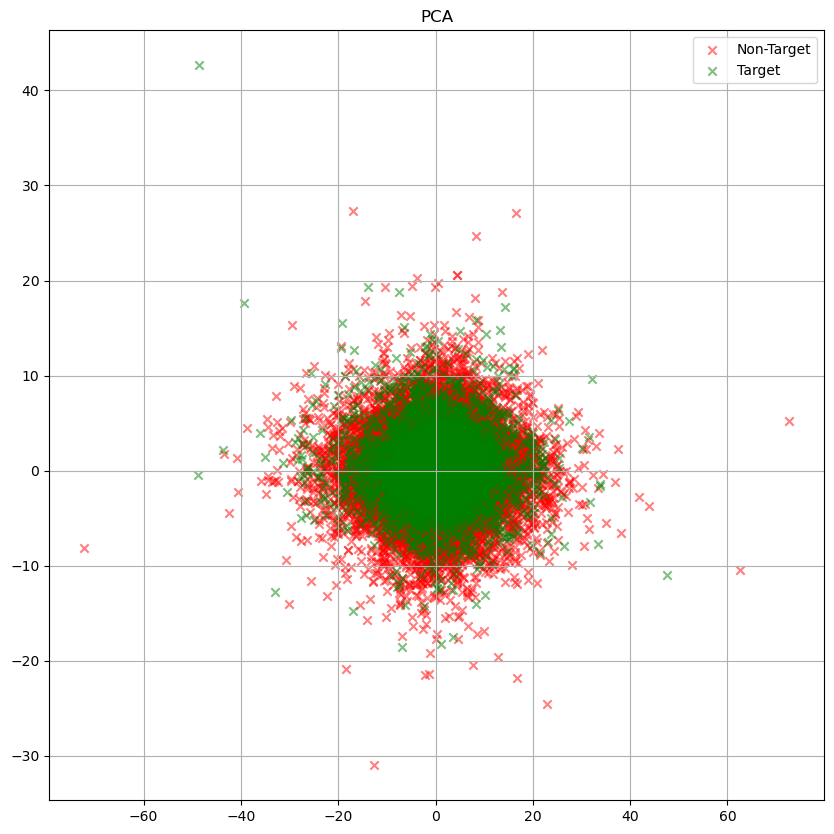

In [33]:

a =  PCA(n_components=2).fit(x).transform(x)
plt.figure(figsize=(10, 10))
plt.title("PCA")
plt.scatter(a[y == 1, 0], a[y == 1, 1], label='Non-Target', color='r', alpha=0.5, marker='x')
plt.scatter(a[y == 2, 0], a[y == 2, 1], label='Target', color='g', alpha=0.5, marker='x')
plt.grid()
plt.legend()
plt.show()

## Stepwise LDA

Source: https://sebastianraschka.com/Articles/2014_python_lda.html

LDA is a supervised machine learning algorithm that reduces the number of dimensions in feature space of a dataset. However, the number of reduced dimension is equal to the minimum value between the number of features in the feature space minus one and total number of classes minus one. Since, this classification algorithm consists of just 2 classes(Target and Non-Target) the reduced number of feature is equal to 1.

Therefore, in order to extract multiple important features using LDA we need to compute Stepwise Linear Discriminant Analysis(SWLDA) which is a form of LDA but calculates multiple important features in order to reduce the dimensionality of the feature space.


### Overview

__Summarizing the LDA approach in 5 steps:__


Listed below are the 5 general steps for performing a linear discriminant analysis; we will explore them in more detail in the following sections.


1. Compute the d-dimensional mean vectors for the different classes from the dataset.


2. Compute the scatter matrices (in-between-class and within-class scatter matrix).


3. Compute the eigenvectors (ee1,ee2,...,eed) and corresponding eigenvalues (λλ1,λλ2,...,λλd) for the scatter matrices.


4. Sort the eigenvectors by decreasing eigenvalues and choose k eigenvectors with the largest eigenvalues to form a d×k dimensional matrix WW (where every column represents an eigenvector).


5. Use this d×k eigenvector matrix to transform the samples onto the new subspace. This can be summarized by the matrix multiplication: YY=XX×WW (where XX is a n×d-dimensional matrix representing the n samples, and yy are the transformed n×k-dimensional samples in the new subspace).


### Compute the d-dimensional mean vectors for the different classes from the dataset.

Calculate Mean of feature vector for all signals of each class.

__Shape of Mean Vector:__ MxN where M is no. of classes and N is No. of features


### 2. Compute the Scatter Matrices

Now, we will compute the two 4x4-dimensional matrices: The within-class and the between-class scatter matrix.

__a. Within Class Scatter Matrix, $S_W$:__

The within-class scatter matrix SW is computed by the following equation:

\begin{equation}
S_W=\sum_{i=1}^c S_i
\end{equation}

where 'c' i the no. of available classes and

\begin{equation}
S_i=\sum_{x∈D_i}^n (x−m_i)(x−m_i)^T
\end{equation}

Here,

__x__ = A feature vector that belongs to the $i^{th}$ class

$D_i$ = The set of feature vectors(signals) in the $i^{th}$ class

__n__ = Total no. of feature vectors/signals in the $i^{th}$ class

$m_i$ = Mean vector for the $i^{th}$ class

\begin{equation}
m_i = \frac{1}{n_i} \sum_{x∈D_i}^n x_k
\end{equation}

Here,

$x_k$ = $k^{th}$ feature vector/signal belonging to the $i^{th}$ class


__b. Between class Scatter matrix, $S_B$:__

The between-class scatter matrix SB is computed by the following equation:

\begin{equation}
S_B = \sum_{i=1}^c N_i (m_i - m) (m_i - m)^T
\end{equation}

Here,

__c__ = Number of Total Classes available

$N_i$ = Size(Total feature vectors/signals) in $i^{th}$ class

$m_i$ = Mean vector of the $i^{th}$ class

$m$ = Overall Mean(For all classes)


### 3. Solving the generalized eigenvalue problem for the matrix $S^{−1}_W S_B$

1. Next, we will solve the generalized eigenvalue problem for the matrix $S^{−1}_W S_B$ to obtain the linear discriminants.

2. Then we will perform a quick check that the eigenvector-eigenvalue calculation is correct and satisfy the equation: \begin{equation}Av=\lambda v\end{equation}

Here,

$A$ = $S^{−1}_W S_B$


$v$ = Eigenvector


$\lambda$ = eigenvalue


### 4. Selecting linear discriminants for the new feature subspace

#### 4.1 Sorting the eigenvectors by decreasing eigenvalues

Remember from the introduction that we are not only interested in merely projecting the data into a subspace that improves the class separability, but also reduces the dimensionality of our feature space, (where the eigenvectors will form the axes of this new feature subspace).

However, the eigenvectors only define the directions of the new axis, since they have all the same unit length 1.

So, in order to decide which eigenvector(s) we want to drop for our lower-dimensional subspace, we have to take a look at the corresponding eigenvalues of the eigenvectors. Roughly speaking, the eigenvectors with the lowest eigenvalues bear the least information about the distribution of the data, and those are the ones we want to drop.
The common approach is to rank the eigenvectors from highest to lowest corresponding eigenvalue and choose the top k eigenvectors.


#### 4.2 Choosing k eigenvectors with the largest eigenvalues

After sorting the eigenpairs by decreasing eigenvalues, it is now time to construct our k×d-dimensional eigenvector matrix W (here N×2: based on the 2 most informative eigenpairs) and thereby reducing the initial N-dimensional feature space into a 2-dimensional feature subspace.


### 5. Transforming the samples onto the new subspace

In the last step, we use the 4×2-dimensional matrix WW that we just computed to transform our samples onto the new subspace via the equation:

\begin{equation}
Y = X x W
\end{equation}

(where X is a n×d-dimensional matrix representing the n samples, and Y are the transformed n×k-dimensional samples in the new subspace).

In [34]:
class StepwiseLDA:
    def __init__(self, n_components):
        self.n_components = n_components
        self.classes = []
        self.eigenpairs = []
        self.weights = None
        
    def transform(self, x):
        if self.weights is None:
            raise ValueError("Please fit the model before using it")
            
        return x.dot(self.weights)
        
        
    def fit(self, x, y):
        self.classes = np.unique(y)
        
        # Calculate mean vectors
        mean_vectors = []
        for c in self.classes:
            mean_vectors.append(np.mean(x[y == c], axis=0))
        mean_vectors = np.array(mean_vectors)
        
        
        
        s_w = np.zeros((x.shape[1],x.shape[1]))  # Create scatter within matrix for each feature
        s_b = np.zeros((x.shape[1],x.shape[1]))  # Between Class Scatter Matrix
        overall_mean = np.mean(x, axis=0).reshape(x.shape[1],1)  # Mean for all classes
        
        for cl, mv in zip(self.classes, mean_vectors):  # For each class and its corresponding mean vector
            mv = mv.reshape(x.shape[1],1) # transpose mean vector of the current class
            x_target = x[y==cl]  # Calculate size/total no. of feature vectors in the current class
            n = x_target.shape[0]
            
            # Calculate within-class Scatter matrix
            class_sc_mat = np.zeros((x.shape[1],x.shape[1]))                  # scatter matrix for every class
            for row in x_target:
                row = row.reshape(x.shape[1],1) # make column vectors
                class_sc_mat += (row-mv).dot((row-mv).T)
            
            s_w += class_sc_mat                             # sum class scatter matrices
            
            # calculate between-class scatter matrix            
            s_b += n * (mv - overall_mean).dot((mv - overall_mean).T)  # Calculate Between class scatter matrix
            
        # Compute Eigen Value and Eigenvector for the dot product between the two matrices
        eig_vals, eig_vecs = np.linalg.eig(np.linalg.inv(s_w).dot(s_b))
        
        
        # Make a list of (eigenvalue, eigenvector) tuples
        self.eigenpairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

        # Sort the (eigenvalue, eigenvector) tuples from high to low
        self.eigenpairs = sorted(self.eigenpairs, key=lambda k: k[0], reverse=True)
        
        # Calculate weights
        self.weights = self.eigenpairs[0][1].reshape(x.shape[1],1)
        #W = np.hstack((, eig_pairs[1][1].reshape(x_tr_an.shape[1],1)))
        for i in range(1, self.n_components):
            self.weights = np.hstack((self.weights, self.eigenpairs[i][1].reshape(x.shape[1],1)))
            
        return self

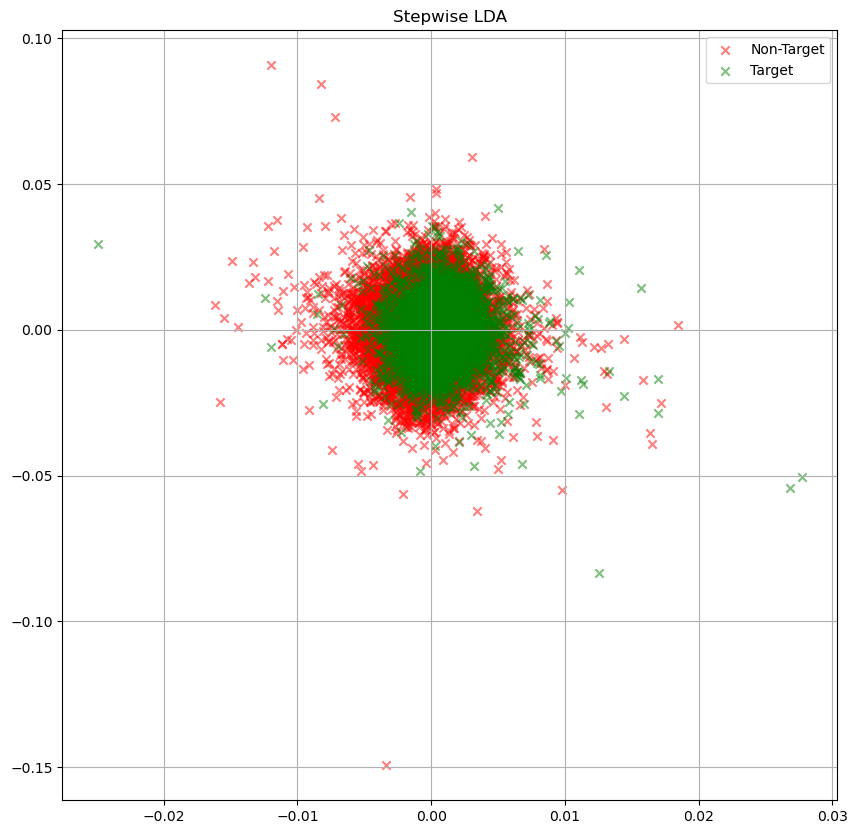

In [37]:
a =  StepwiseLDA(n_components=2).fit(x, y).transform(x)
plt.figure(figsize=(10, 10))
plt.title("Stepwise LDA")
plt.scatter(a[y == 1, 0].real, a[y == 1, 1].real, label='Non-Target', color='r', alpha=0.5, marker='x')
plt.scatter(a[y == 2, 0].real, a[y == 2, 1].real, label='Target', color='g', alpha=0.5, marker='x')
plt.grid()
plt.legend()
plt.show()

## Random Forest Classification

In [62]:
# Balancing the dataset
data_per_class = 5600
indices = np.concatenate((np.where(y == 1)[0][:data_per_class], np.where(y == 2)[0][:data_per_class]))
x_temp = x[indices, :]
y_temp = y[indices]

X_train, X_test, y_train, y_test = train_test_split(x_temp, y_temp, test_size=0.2, random_state=6150)

(8960, 136) (8960,) (2240, 136) (2240,)


In [63]:
lda = StepwiseLDA(2)
lda.fit(X_train, y_train)
a, b = lda.transform(X_train), lda.transform(X_test)
clf = RandomForestClassifier(max_depth=2, random_state=26784)
clf.fit(a.real, y_train)
print(f"Accuracy: {clf.score(b.real, y_test)*100:.5f}%")

Accuracy: 59.28571%
